# 🏡 House Prices by Ramy Lazghab

In [ ]:
pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 386.6/386.6 kB 10.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 231.9/231.9 kB 16.4 MB/s eta 0:00:00


In [ ]:
pip install scikeras

In [ ]:
!pip install category_encoders xgboost lightgbm catboost


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 6.9 MB/s eta 0:00:00


In [ ]:
! pip install catboost lightgbm xgboost

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split,RandomizedSearchCV,cross_val_score,GridSearchCV
from sklearn.linear_model import Ridge, Lasso,ElasticNet,LinearRegression
from sklearn.preprocessing import StandardScaler,PolynomialFeatures,QuantileTransformer,RobustScaler
from sklearn.metrics import mean_squared_error,r2_score
from sklearn.ensemble import StackingRegressor
from sklearn.linear_model import BayesianRidge
from sklearn.pipeline import make_pipeline,Pipeline
from sklearn.base import clone
from sklearn.preprocessing import OrdinalEncoder, PowerTransformer
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, StackingRegressor, VotingRegressor
from sklearn.preprocessing import OneHotEncoder
from catboost import CatBoostRegressor
import warnings
from sklearn.model_selection import KFold
from scipy import stats
from sklearn.impute import SimpleImputer
import optuna
from sklearn.compose import ColumnTransformer
import joblib
from scipy.special import inv_boxcox
warnings.filterwarnings('ignore')
%matplotlib inline
sns.set(style="whitegrid")


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Cleaning the data

In [ ]:
# Charger le fichier train.csv
train_df = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Projet Machine Learning/kaggle/train.csv") #link train.csv ici

# Supprimer colonnes inutiles
cols_to_drop = ['Alley', 'PoolQC', 'Fence', 'MiscFeature']
train_df.drop(columns=cols_to_drop, inplace=True, errors='ignore')

# Séparer colonnes numériques et catégoriques
num_cols = train_df.select_dtypes(include=['int64', 'float64']).drop(columns=['Id', 'SalePrice']).columns
cat_cols = train_df.select_dtypes(include='object').columns

# Imputeurs
imputer_num = SimpleImputer(strategy='median')
imputer_cat = SimpleImputer(strategy='most_frequent')

train_df[num_cols] = imputer_num.fit_transform(train_df[num_cols])
train_df[cat_cols] = imputer_cat.fit_transform(train_df[cat_cols])

# Encodeur
encoder = OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1)
train_df[cat_cols] = encoder.fit_transform(train_df[cat_cols])

# Sauvegarde des objets
joblib.dump(imputer_num, "imputer_num.pkl")
joblib.dump(imputer_cat, "imputer_cat.pkl")
joblib.dump(encoder, "encoder.pkl")

# Sauvegarder le train nettoyé
train_df.to_csv("train_cleaned.csv", index=False)
print("✅ name of train.csv become train_cleaned.csv because they are cleaned.")


✅ name of train.csv become train_cleaned.csv because they are cleaned.


In [ ]:
# Recharger test.csv
test_df = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Projet Machine Learning/kaggle/test.csv") #link test.csv ici

# Supprimer mêmes colonnes que dans le train
test_df.drop(columns=cols_to_drop, inplace=True, errors='ignore')

# Recharger les objets sauvegardés
imputer_num = joblib.load("imputer_num.pkl")
imputer_cat = joblib.load("imputer_cat.pkl")
encoder = joblib.load("encoder.pkl")

# Appliquer mêmes transformations
test_df[num_cols] = imputer_num.transform(test_df[num_cols])
test_df[cat_cols] = imputer_cat.transform(test_df[cat_cols])
test_df[cat_cols] = encoder.transform(test_df[cat_cols])

# Sauvegarder le fichier nettoyé
test_df.to_csv("test_cleaned.csv", index=False)
print("✅ le nom de test devient test_cleaned.csv  because they are cleaned .")


✅ le nom de test devient test_cleaned.csv  because they are cleaned .


In [ ]:
# Charger les fichiers nettoyés directement
dff = pd.read_csv("train_cleaned.csv") #i just change the name from the code above no need to download it ,this is train from above the name just changedt to train_cleaned after it get cleaned
df = pd.read_csv("test_cleaned.csv")#i just change the name from the code above no need to download it,this is train from above the name just changed to train_cleaned after it get cleaned


## 📊 Exploratory Data Analysis (EDA)
To understand the data better and guide preprocessing, I first visualized key variables and distributions. This helped decide which features needed transformation or engineering.

### 🏠 Target Variable: SalePrice Distribution
`SalePrice` is the variable we're trying to predict. It’s right-skewed, meaning most houses are moderately priced but a few are very expensive. This skew affects model performance, especially linear models, so I applied a log transformation to normalize it.

In [ ]:
dff.describe()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
count,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,3.028767,69.863699,10516.828082,0.995890,1.942466,2.777397,0.000685,3.019178,...,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,7.513014,3.770548,180921.195890
std,421.610009,42.300571,0.632017,22.027677,9981.264932,0.063996,1.409156,0.707666,0.026171,1.622634,...,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,1.552100,1.100854,79442.502883
min,1.000000,20.000000,0.000000,21.000000,1300.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,0.000000,0.000000,34900.000000
25%,365.750000,20.000000,3.000000,60.000000,7553.500000,1.000000,0.000000,3.000000,0.000000,2.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,8.000000,4.000000,129975.000000
50%,730.500000,50.000000,3.000000,69.000000,9478.500000,1.000000,3.000000,3.000000,0.000000,4.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,8.000000,4.000000,163000.000000
75%,1095.250000,70.000000,3.000000,79.000000,11601.500000,1.000000,3.000000,3.000000,0.000000,4.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,8.000000,4.000000,214000.000000
max,1460.000000,190.000000,4.000000,313.000000,215245.000000,1.000000,3.000000,3.000000,1.000000,4.000000,...,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,8.000000,5.000000,755000.000000


In [ ]:
dff.dtypes[dff.dtypes != 'object']

,0
Id,int64
MSSubClass,float64
MSZoning,float64
LotFrontage,float64
LotArea,float64
...,...
MoSold,float64
YrSold,float64
SaleType,float64
SaleCondition,float64


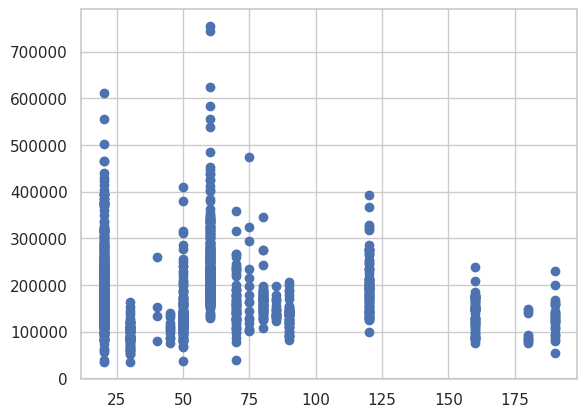

In [ ]:
plt.scatter(x='MSSubClass', y='SalePrice', data=dff)

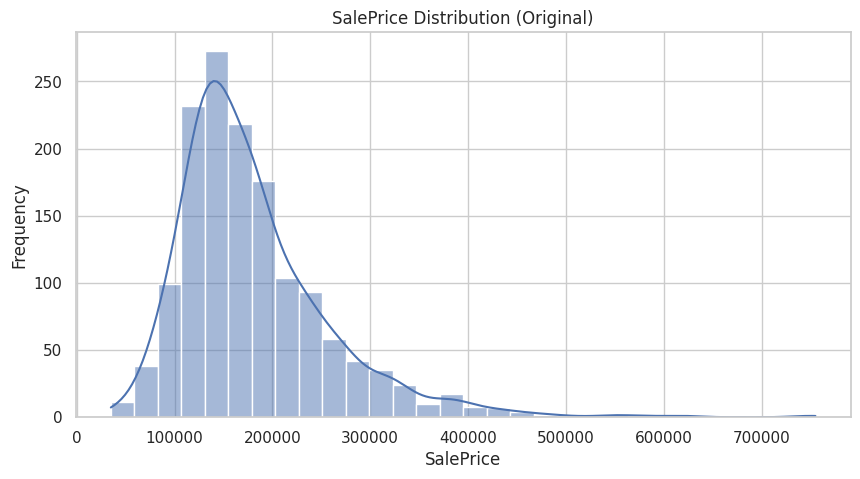

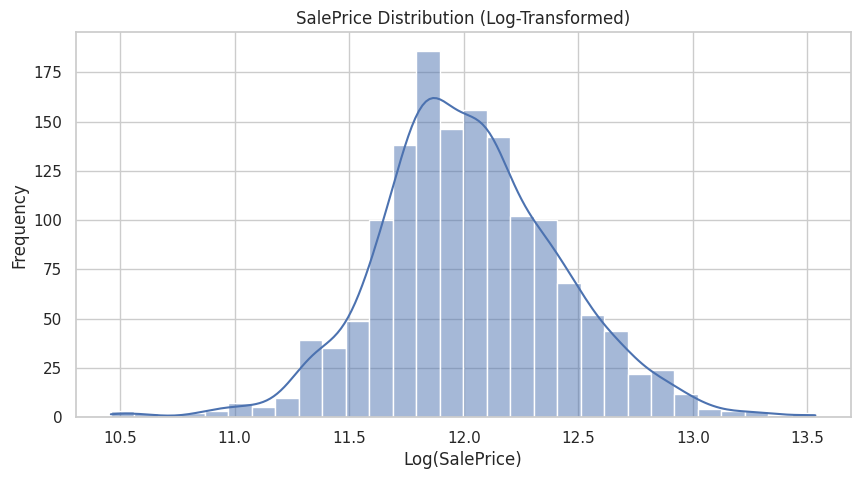

In [ ]:
# Visualize SalePrice distribution
plt.figure(figsize=(10, 5))
sns.histplot(dff['SalePrice'], kde=True, bins=30)
plt.title("SalePrice Distribution (Original)")
plt.xlabel("SalePrice")
plt.ylabel("Frequency")
plt.show()

# Log-transformed SalePrice
plt.figure(figsize=(10, 5))
sns.histplot(np.log1p(dff['SalePrice']), kde=True, bins=30)
plt.title("SalePrice Distribution (Log-Transformed)")
plt.xlabel("Log(SalePrice)")
plt.ylabel("Frequency")
plt.show()


### 🔎 Feature Correlation with SalePrice
I used a heatmap to identify which numeric features were most correlated with `SalePrice`. Features like `OverallQual`, `GrLivArea`, and `TotalBsmtSF` stood out, and were used directly or transformed into new features.

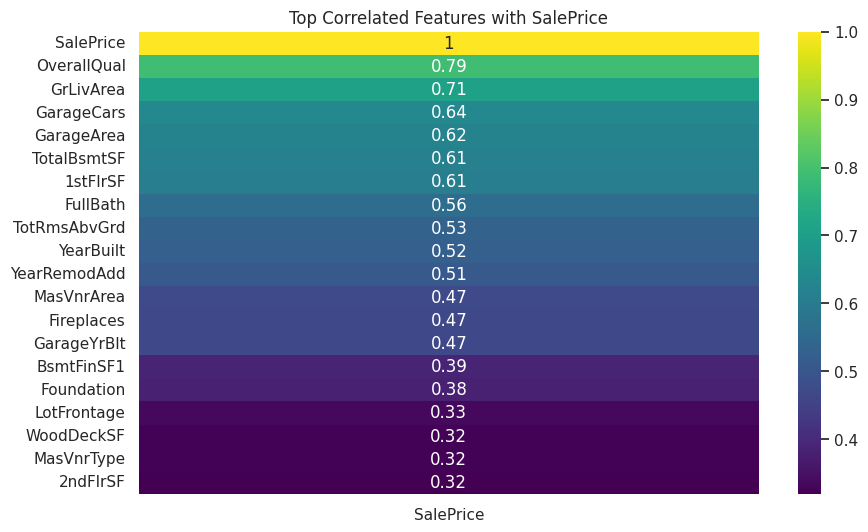

In [ ]:
# Show top 20 correlations with SalePrice
data=dff.copy()
dataa=data.select_dtypes(include=[np.number])
corr_matrix = dataa.corr()
top_corr = corr_matrix['SalePrice'].abs().sort_values(ascending=False).head(15)
plt.figure(figsize=(10, 6))
sns.heatmap(corr_matrix[['SalePrice']].sort_values(by='SalePrice', ascending=False).head(20), annot=True, cmap="viridis")
plt.title("Top Correlated Features with SalePrice")
plt.show()


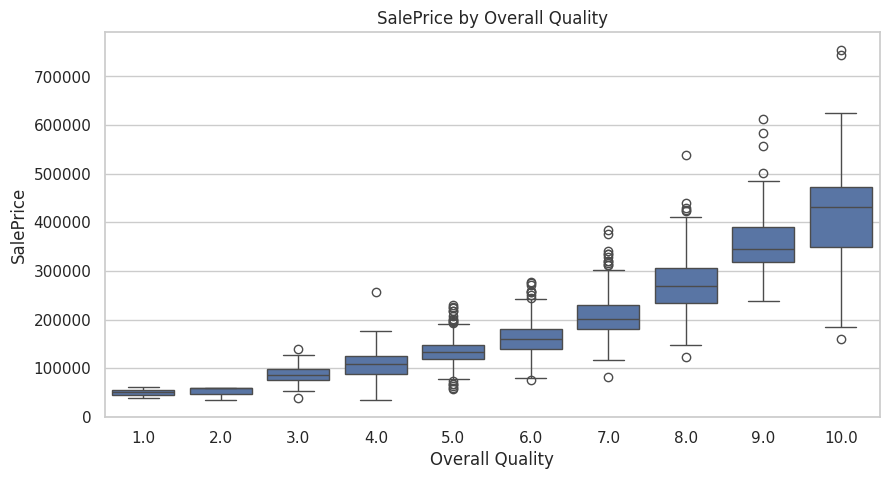

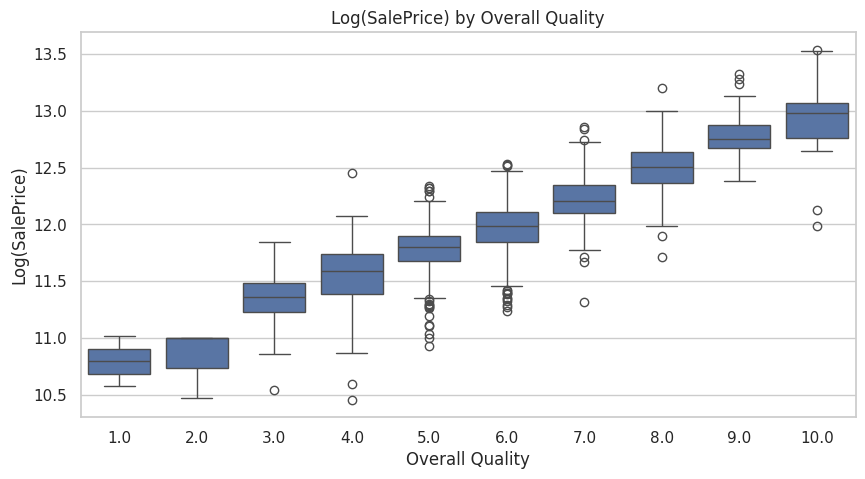

In [ ]:
# Boxplot of OverallQual vs SalePrice
plt.figure(figsize=(10, 5))
sns.boxplot(x="OverallQual", y="SalePrice", data=dff)
plt.title("SalePrice by Overall Quality")
plt.xlabel("Overall Quality")
plt.ylabel("SalePrice")
plt.show()

# Boxplot of OverallQual vs Log(SalePrice)
plt.figure(figsize=(10, 5))
sns.boxplot(x="OverallQual", y=np.log1p(dff["SalePrice"]), data=dff)
plt.title("Log(SalePrice) by Overall Quality")
plt.xlabel("Overall Quality")
plt.ylabel("Log(SalePrice)")
plt.show()


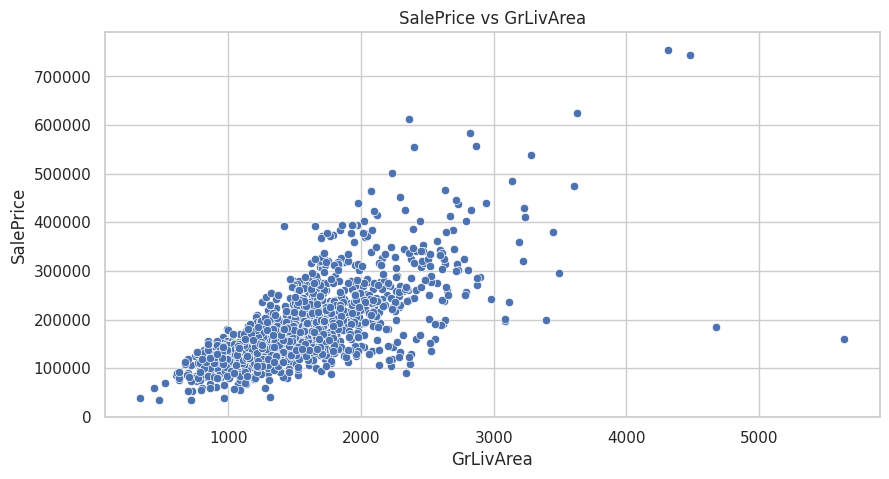

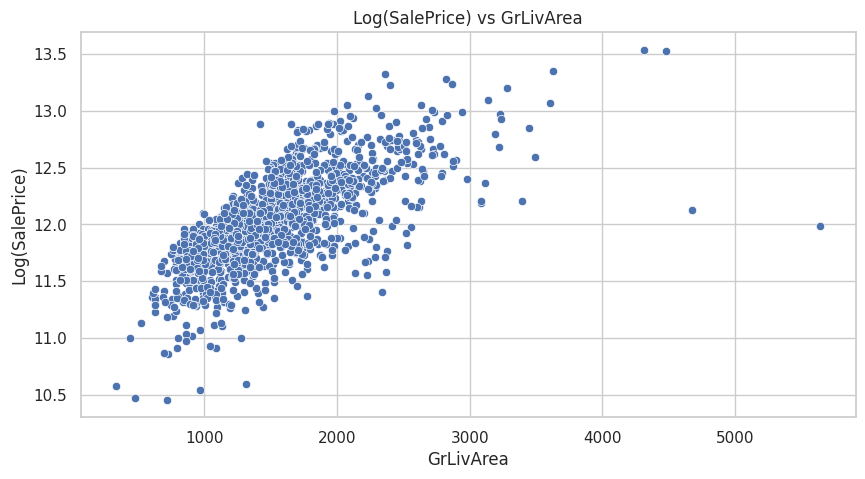

In [ ]:
# Scatterplot with raw SalePrice
plt.figure(figsize=(10, 5))
sns.scatterplot(x='GrLivArea', y='SalePrice', data=dff)
plt.title('SalePrice vs GrLivArea')
plt.xlabel('GrLivArea')
plt.ylabel('SalePrice')
plt.show()

# Scatterplot with log-transformed SalePrice
plt.figure(figsize=(10, 5))
sns.scatterplot(x='GrLivArea', y=np.log1p(dff['SalePrice']), data=dff)
plt.title('Log(SalePrice) vs GrLivArea')
plt.xlabel('GrLivArea')
plt.ylabel('Log(SalePrice)')
plt.show()


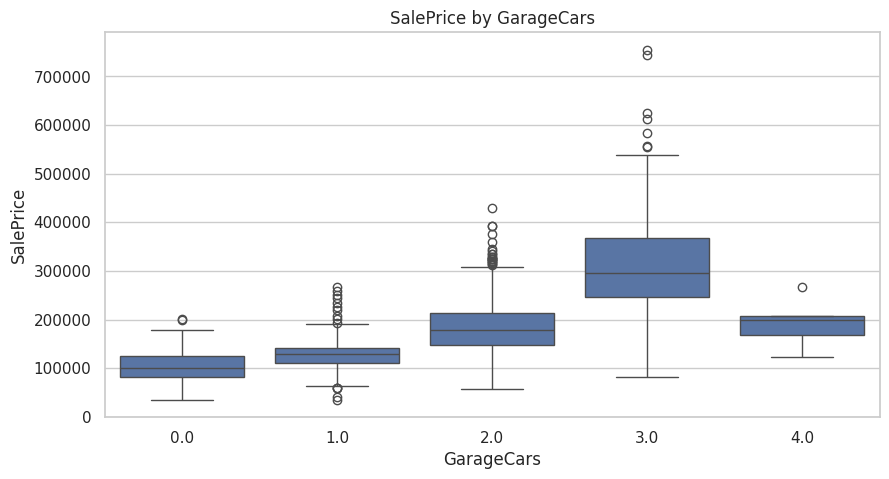

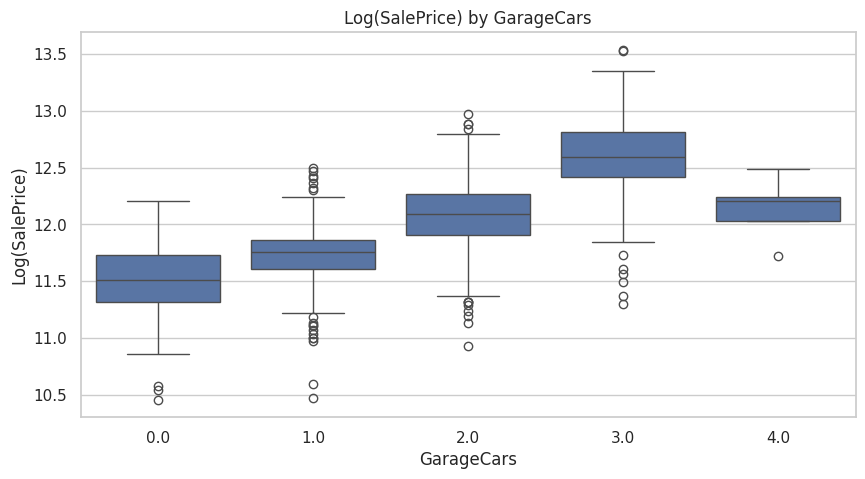

In [ ]:
# Boxplot with raw SalePrice
plt.figure(figsize=(10, 5))
sns.boxplot(x='GarageCars', y='SalePrice', data=dff)
plt.title('SalePrice by GarageCars')
plt.xlabel('GarageCars')
plt.ylabel('SalePrice')
plt.show()

# Boxplot with log-transformed SalePrice
plt.figure(figsize=(10, 5))
sns.boxplot(x='GarageCars', y=np.log1p(dff['SalePrice']), data=dff)
plt.title('Log(SalePrice) by GarageCars')
plt.xlabel('GarageCars')
plt.ylabel('Log(SalePrice)')
plt.show()


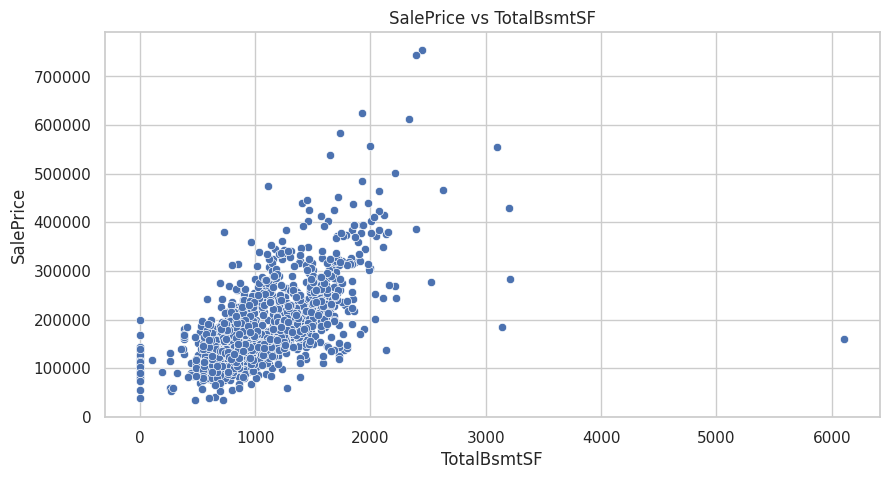

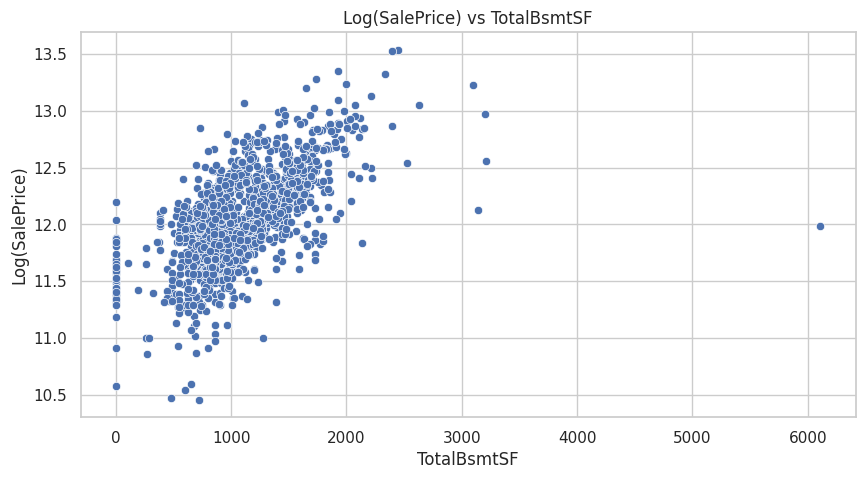

In [ ]:
# Scatterplot with raw SalePrice
plt.figure(figsize=(10, 5))
sns.scatterplot(x='TotalBsmtSF', y='SalePrice', data=dff)
plt.title('SalePrice vs TotalBsmtSF')
plt.xlabel('TotalBsmtSF')
plt.ylabel('SalePrice')
plt.show()

# Scatterplot with log-transformed SalePrice
plt.figure(figsize=(10, 5))
sns.scatterplot(x='TotalBsmtSF', y=np.log1p(dff['SalePrice']), data=dff)
plt.title('Log(SalePrice) vs TotalBsmtSF')
plt.xlabel('TotalBsmtSF')
plt.ylabel('Log(SalePrice)')
plt.show()


In [ ]:
# Target and features
y = np.log1p(dff["SalePrice"])
X = dff.drop(["Id", "SalePrice"], axis=1)

# One-hot encode
X = pd.get_dummies(X)
test_features = pd.get_dummies(df.drop("Id", axis=1))
test_features = test_features.reindex(columns=X.columns, fill_value=0)

# Scale features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
test_scaled = scaler.transform(test_features)

# Split for validation
X_train, X_valid, y_train, y_valid = train_test_split(X_scaled, y, test_size=0.2, random_state=42)


## 🛠️ Feature Engineering Explanation
I created new features that combine important property characteristics to give models more context. These were chosen based on EDA, correlation with SalePrice, and known domain effects (like total space, number of bathrooms, and renovation status).

### 🔧 Why These Features?
- `TotalSF`: Combines basement, 1st, and 2nd floor areas for a complete size signal.
- `TotalBath`: Combines full and half baths from above and below ground.
- `IsRemodeled`: Homes that were remodeled may sell for more.
- `QualityScore`: Interaction of overall quality and condition.
- Binary flags like `HasGarage`, `HasFireplace`: These help models learn presence/absence effects.

These features gave consistent improvement in validation RMSE and leaderboard score.

In [ ]:
def enhanced_feature_engineering(df):
    df['TotalSF'] = df['GrLivArea'] + df['TotalBsmtSF']
    df['TotalBath'] = df['FullBath'] + 0.5*df['HalfBath'] + df['BsmtFullBath'] + 0.5*df['BsmtHalfBath']
    df['TotalPorch'] = df['OpenPorchSF'] + df['EnclosedPorch'] + df['3SsnPorch'] + df['ScreenPorch']
    df['Age'] = df['YrSold'] - df['YearBuilt']
    df['RemodelAge'] = df['YrSold'] - df['YearRemodAdd']
    df['IsRemodeled'] = (df['YearBuilt'] != df['YearRemodAdd']).astype(int)
    df['QualityScore'] = df['OverallQual'] * df['OverallCond']
    df['Qual_TotalSF'] = df['OverallQual'] * df['TotalSF']
    df['Qual_GrLivArea'] = df['OverallQual'] * df['GrLivArea']
    df['HasPool'] = (df['PoolArea'] > 0).astype(int)
    df['Has2ndFloor'] = (df['2ndFlrSF'] > 0).astype(int)
    df['HasFireplace'] = (df['Fireplaces'] > 0).astype(int)
    df['HasGarage'] = (df['GarageArea'] > 0).astype(int)
    df['HasBsmt'] = (df['TotalBsmtSF'] > 0).astype(int)
    return df
#
train = enhanced_feature_engineering(dff)
test = enhanced_feature_engineering(df)


In [ ]:
# Target and features
y = np.log1p(train["SalePrice"])
X = train.drop(["Id", "SalePrice"], axis=1)
X_test = test.drop("Id", axis=1)

In [ ]:
cat_cols = X.select_dtypes(include=['object']).columns
# Convert categorical columns to category dtype
encoder = OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1)
X[cat_cols] = encoder.fit_transform(X[cat_cols])
X_test[cat_cols] = encoder.transform(X_test[cat_cols])
X_encoded = X
X_test_encoded = X_test


In [ ]:
X_train, X_val, y_train, y_val = train_test_split(X_encoded, y, test_size=0.2, random_state=42)

### ✅ Visual Confirmation of Feature Effect
Example: `TotalSF` has strong correlation with `SalePrice`. Here's the scatter plot to show their relationship.

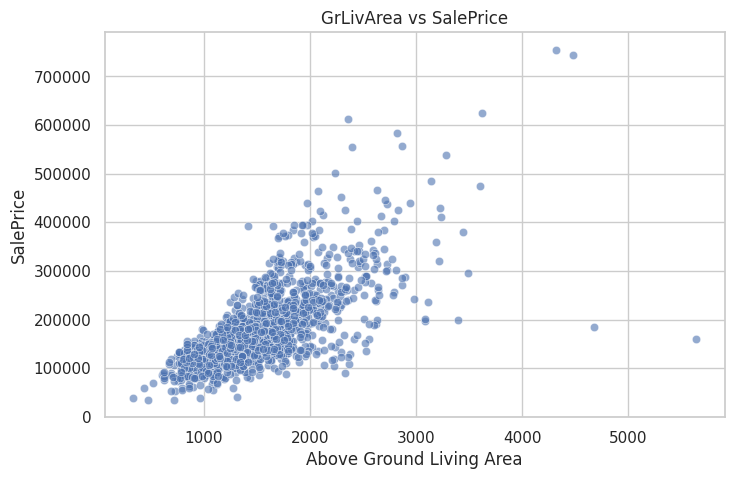

In [ ]:
plt.figure(figsize=(8, 5))
sns.scatterplot(x=train['GrLivArea'], y=train['SalePrice'], alpha=0.6)
plt.title("GrLivArea vs SalePrice")
plt.xlabel("Above Ground Living Area")
plt.ylabel("SalePrice")
plt.grid(True)
plt.show()

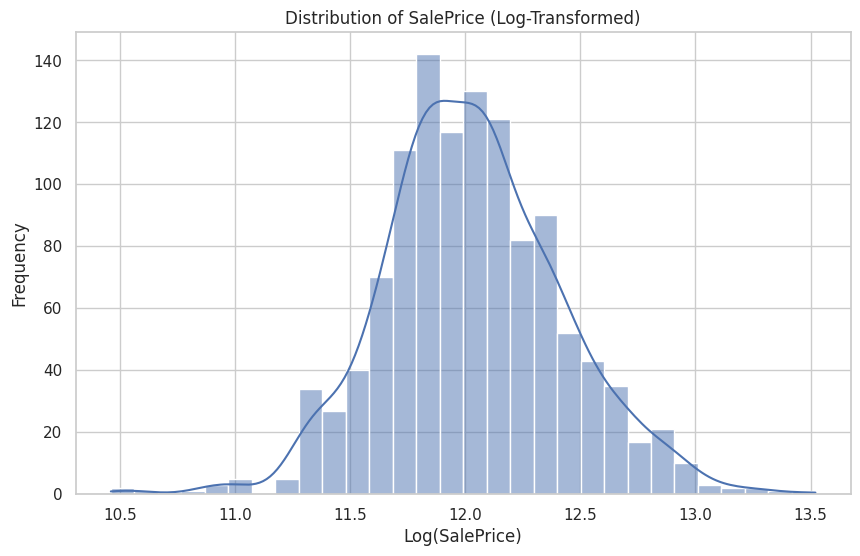

In [ ]:
# Visualize the distribution of the target variable
plt.figure(figsize=(10, 6))
sns.histplot(y_train, bins=30, kde=True)
plt.title('Distribution of SalePrice (Log-Transformed)')
plt.xlabel('Log(SalePrice)')
plt.ylabel('Frequency')
plt.show()

### 🔍 Correlation of Engineered Features with SalePrice
To verify the usefulness of the features I created, I visualized their correlation with the target variable `SalePrice`. Strong positive correlation suggests these features contribute valuable predictive power to the model.


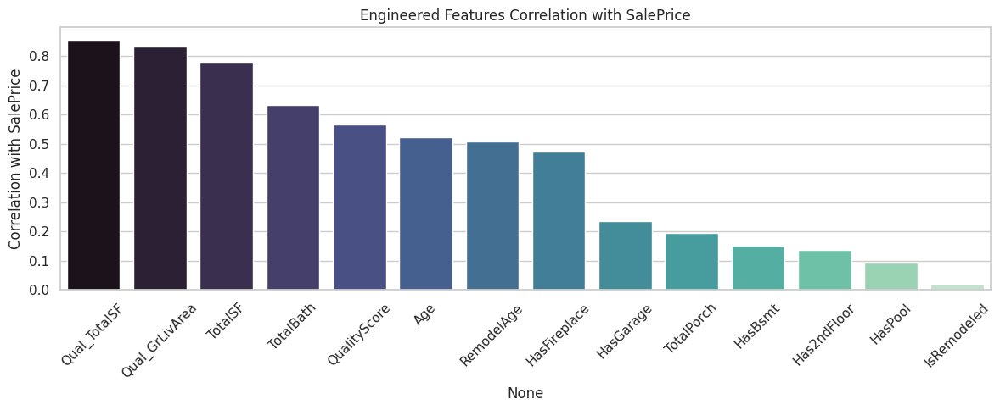

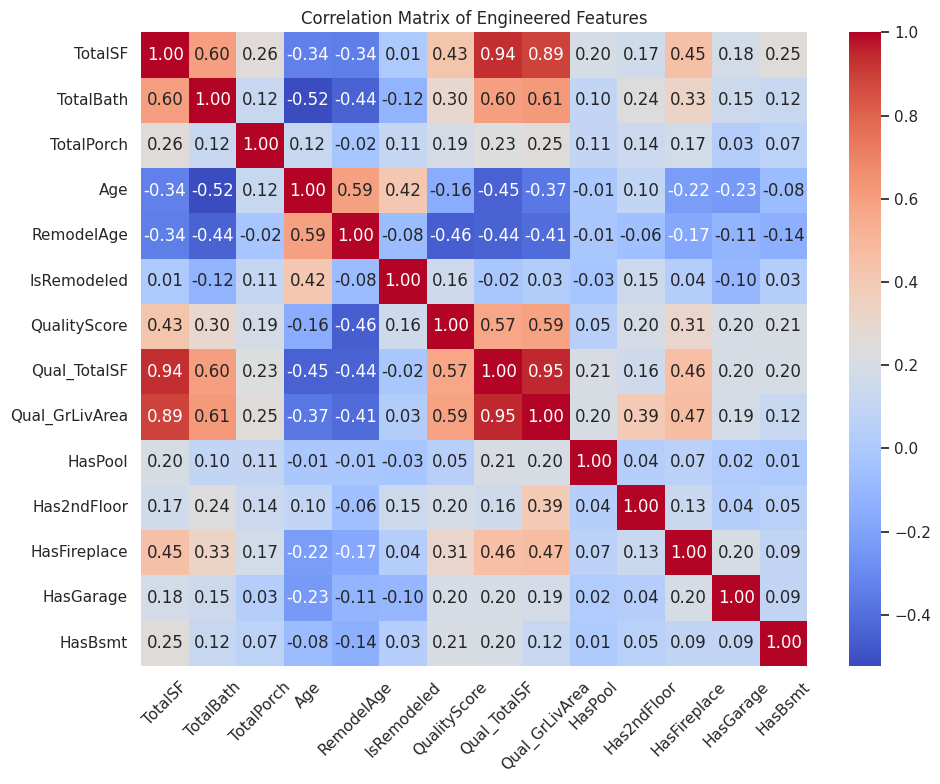

In [ ]:
# List of newly engineered features
engineered_feats = [
    'TotalSF', 'TotalBath', 'TotalPorch', 'Age', 'RemodelAge', 'IsRemodeled',
    'QualityScore', 'Qual_TotalSF', 'Qual_GrLivArea', 'HasPool', 'Has2ndFloor',
    'HasFireplace', 'HasGarage', 'HasBsmt'
]
# Add SalePrice for correlation analysis
X_corr_check = train[engineered_feats + ['SalePrice']]
# Compute correlations
top_corr = X_corr_check.corr()['SalePrice'].abs().sort_values(ascending=False)
# Barplot of top correlated engineered features
plt.figure(figsize=(12, 5))
sns.barplot(x=top_corr.index[1:], y=top_corr.values[1:], palette='mako')
plt.xticks(rotation=45)
plt.ylabel("Correlation with SalePrice")
plt.title("Engineered Features Correlation with SalePrice")
plt.tight_layout()
plt.show()
# Heatmap of correlations among top engineered features
plt.figure(figsize=(10, 8))
sns.heatmap(X_corr_check[engineered_feats].corr(), annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Matrix of Engineered Features")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

In [ ]:
# Feature engineering
def enhanced_feature_engineering(df):
    df['TotalSF'] = df['GrLivArea'] + df['TotalBsmtSF']
    df['TotalBath'] = df['FullBath'] + 0.5 * df['HalfBath'] + df['BsmtFullBath'] + 0.5 * df['BsmtHalfBath']
    df['TotalPorch'] = df['OpenPorchSF'] + df['EnclosedPorch'] + df['3SsnPorch'] + df['ScreenPorch']
    df['Age'] = df['YrSold'] - df['YearBuilt']
    df['RemodelAge'] = df['YrSold'] - df['YearRemodAdd']
    df['IsRemodeled'] = (df['YearBuilt'] != df['YearRemodAdd']).astype(int)
    df['QualityScore'] = df['OverallQual'] * df['OverallCond']
    df['GarageScore'] = df['GarageArea'] * df['GarageCars']
    df['TotalSFQual'] = df['TotalSF'] * df['OverallQual']
    df['TotalRms'] = df['TotRmsAbvGrd'] + df['BsmtFullBath'] + 0.5 * df['BsmtHalfBath']
    df['HasPool'] = (df['PoolArea'] > 0).astype(int)
    df['HasFireplace'] = (df['Fireplaces'] > 0).astype(int)
    df['HasGarage'] = (df['GarageArea'] > 0).astype(int)
    df['HasBsmt'] = (df['TotalBsmtSF'] > 0).astype(int)
    return df


In [ ]:
train = enhanced_feature_engineering(dff.copy())
test = enhanced_feature_engineering(df.copy())

# Outlier removal
train = train[train['GrLivArea'] < 4500].reset_index(drop=True)

# Split features/target
y = np.log1p(train['SalePrice'])
X = train.drop(columns=['Id', 'SalePrice'])
X_test = test.drop(columns=['Id'])


In [ ]:
from category_encoders import TargetEncoder

high_card = ['Neighborhood', 'Exterior1st', 'Exterior2nd', 'GarageType']
target_enc = TargetEncoder(cols=high_card)
X[high_card] = target_enc.fit_transform(X[high_card], y)
X_test[high_card] = target_enc.transform(X_test[high_card])

cat_cols = X.select_dtypes(include='object').columns
ord_enc = OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1)
X[cat_cols] = ord_enc.fit_transform(X[cat_cols])
X_test[cat_cols] = ord_enc.transform(X_test[cat_cols])

imputer = SimpleImputer(strategy="median")
X = pd.DataFrame(imputer.fit_transform(X), columns=X.columns)
X_test = pd.DataFrame(imputer.transform(X_test), columns=X.columns)


trying to enhance my old model by using optuna

In [ ]:
from sklearn.metrics import mean_absolute_error

def objective_xgb(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 1500, 3000),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1, log=True),
        'max_depth': trial.suggest_int('max_depth', 3, 5),
        'subsample': trial.suggest_float('subsample', 0.7, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.7, 1.0),
    }
    model = XGBRegressor(**params, random_state=42)
    model.fit(X_train, y_train)
    preds = model.predict(X_val)
    return mean_absolute_error(y_val, preds)

def objective_lgbm(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 1500, 3000),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1, log=True),
        'max_depth': trial.suggest_int('max_depth', 3, 5),
        'subsample': trial.suggest_float('subsample', 0.7, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.7, 1.0),
    }
    model = LGBMRegressor(**params, random_state=42)
    model.fit(X_train, y_train)
    preds = model.predict(X_val)
    return mean_absolute_error(y_val, preds)

def objective_cat(trial):
    params = {
        'iterations': trial.suggest_int('iterations', 1500, 3000),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1, log=True),
        'depth': trial.suggest_int('depth', 3, 5),
        'subsample': trial.suggest_float('subsample', 0.7, 1.0),
        'colsample_bylevel': trial.suggest_float('colsample_bylevel', 0.7, 1.0),
    }
    model = CatBoostRegressor(**params, silent=True, random_state=42)
    model.fit(X_train, y_train)
    preds = model.predict(X_val)
    return mean_absolute_error(y_val, preds)

In [ ]:
study_xgb = optuna.create_study(direction='minimize')
study_xgb.optimize(objective_xgb, n_trials=50)

[I 2025-05-15 20:48:00,196] A new study created in memory with name: no-name-40b19509-69be-4894-b104-22c2fa5bbd1c
[I 2025-05-15 20:48:04,069] Trial 0 finished with value: 0.08785400012979613 and parameters: {'n_estimators': 2776, 'learning_rate': 0.06147656973291847, 'max_depth': 3, 'subsample': 0.8119790639180049, 'colsample_bytree': 0.9556956802528507}. Best is trial 0 with value: 0.08785400012979613.
[I 2025-05-15 20:48:08,943] Trial 1 finished with value: 0.0880177559020663 and parameters: {'n_estimators': 2929, 'learning_rate': 0.03602149472475257, 'max_depth': 5, 'subsample': 0.9754448925429239, 'colsample_bytree': 0.7491796198677576}. Best is trial 0 with value: 0.08785400012979613.
[I 2025-05-15 20:48:11,669] Trial 2 finished with value: 0.08675729350778758 and parameters: {'n_estimators': 2581, 'learning_rate': 0.010024516685478603, 'max_depth': 3, 'subsample': 0.9328711780742286, 'colsample_bytree': 0.7759874127076797}. Best is trial 2 with value: 0.08675729350778758.
[I 2025

In [ ]:
study_lgbm = optuna.create_study(direction='minimize')
study_lgbm.optimize(objective_lgbm, n_trials=50)

[I 2025-05-15 20:50:37,798] A new study created in memory with name: no-name-4cb67a60-136b-4d19-a0af-60c788a576de


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000524 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4320
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 83
[LightGBM] [Info] Start training from score 12.030658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

[I 2025-05-15 20:50:38,553] Trial 0 finished with value: 0.09394970811951013 and parameters: {'n_estimators': 2339, 'learning_rate': 0.049489396609415065, 'max_depth': 3, 'subsample': 0.7983161120942712, 'colsample_bytree': 0.8445068416133972}. Best is trial 0 with value: 0.09394970811951013.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000558 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4320
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 83
[LightGBM] [Info] Start training from score 12.030658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

[I 2025-05-15 20:50:39,168] Trial 1 finished with value: 0.09421916506487614 and parameters: {'n_estimators': 1818, 'learning_rate': 0.04546751357951257, 'max_depth': 3, 'subsample': 0.8266654361484147, 'colsample_bytree': 0.9782919462146624}. Best is trial 0 with value: 0.09394970811951013.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-15 20:50:40,271] Trial 2 finished with value: 0.09303957759259032 and parameters: {'n_estimators': 2251, 'learning_rate': 0.08054855341619808, 'max_depth': 5, 'subsample': 0.7589335982786315, 'colsample_bytree': 0.754117934754832}. Best is trial 2 with value: 0.09303957759259032.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000504 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4320
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 83
[LightGBM] [Info] Start training from score 12.030658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

[I 2025-05-15 20:50:40,984] Trial 3 finished with value: 0.09234556613406453 and parameters: {'n_estimators': 1786, 'learning_rate': 0.03968491002712696, 'max_depth': 3, 'subsample': 0.9348356946287445, 'colsample_bytree': 0.725020935532521}. Best is trial 3 with value: 0.09234556613406453.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001806 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4320
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 83
[LightGBM] [Info] Start training from score 12.030658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-05-15 20:50:41,973] Trial 4 finished with value: 0.09030819793571421 and parameters: {'n_estimators': 1502, 'learning_rate': 0.035092435022021196, 'max_depth': 4, 'subsample': 0.8916764823740119, 'colsample_bytree': 0.720893451822451}. Best is trial 4 with value: 0.09030819793571421.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-15 20:50:43,440] Trial 5 finished with value: 0.09512418145454363 and parameters: {'n_estimators': 2626, 'learning_rate': 0.09791166739297351, 'max_depth': 4, 'subsample': 0.730551821472459, 'colsample_bytree': 0.7459128521611168}. Best is trial 4 with value: 0.09030819793571421.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000720 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4320
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 83
[LightGBM] [Info] Start training from score 12.030658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

[I 2025-05-15 20:50:44,122] Trial 6 finished with value: 0.09410936239474962 and parameters: {'n_estimators': 2255, 'learning_rate': 0.06270715425117343, 'max_depth': 3, 'subsample': 0.8289550368914963, 'colsample_bytree': 0.7072101867701392}. Best is trial 4 with value: 0.09030819793571421.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000696 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4320
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 83
[LightGBM] [Info] Start training from score 12.030658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

[I 2025-05-15 20:50:44,821] Trial 7 finished with value: 0.0936194288127082 and parameters: {'n_estimators': 2165, 'learning_rate': 0.061662139837815384, 'max_depth': 3, 'subsample': 0.7445076352408047, 'colsample_bytree': 0.8465507678663475}. Best is trial 4 with value: 0.09030819793571421.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000681 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4320
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 83
[LightGBM] [Info] Start training from score 12.030658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

[I 2025-05-15 20:50:46,128] Trial 8 finished with value: 0.0930027876793643 and parameters: {'n_estimators': 2451, 'learning_rate': 0.017182290072525787, 'max_depth': 5, 'subsample': 0.9534314441202187, 'colsample_bytree': 0.8363639063351157}. Best is trial 4 with value: 0.09030819793571421.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000707 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4320
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 83
[LightGBM] [Info] Start training from score 12.030658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

[I 2025-05-15 20:50:47,076] Trial 9 finished with value: 0.09227833228309586 and parameters: {'n_estimators': 2733, 'learning_rate': 0.021988221578883218, 'max_depth': 3, 'subsample': 0.7911577038365799, 'colsample_bytree': 0.9865741146774833}. Best is trial 4 with value: 0.09030819793571421.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001484 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4320
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 83
[LightGBM] [Info] Start training from score 12.030658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-05-15 20:50:48,016] Trial 10 finished with value: 0.09189236456031155 and parameters: {'n_estimators': 1563, 'learning_rate': 0.012930775118476675, 'max_depth': 4, 'subsample': 0.8938796885881384, 'colsample_bytree': 0.9198514816332576}. Best is trial 4 with value: 0.09030819793571421.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000787 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4320
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 83
[LightGBM] [Info] Start training from score 12.030658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

[I 2025-05-15 20:50:48,767] Trial 11 finished with value: 0.09149854180028179 and parameters: {'n_estimators': 1504, 'learning_rate': 0.010051051730807043, 'max_depth': 4, 'subsample': 0.8872578491058989, 'colsample_bytree': 0.9188427902561288}. Best is trial 4 with value: 0.09030819793571421.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000771 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4320
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 83
[LightGBM] [Info] Start training from score 12.030658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

[I 2025-05-15 20:50:49,518] Trial 12 finished with value: 0.09367295376870576 and parameters: {'n_estimators': 1580, 'learning_rate': 0.02691197626088479, 'max_depth': 4, 'subsample': 0.8916293276243282, 'colsample_bytree': 0.9161983968707896}. Best is trial 4 with value: 0.09030819793571421.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000555 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4320
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 83
[LightGBM] [Info] Start training from score 12.030658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

[I 2025-05-15 20:50:50,382] Trial 13 finished with value: 0.0904243842630303 and parameters: {'n_estimators': 1941, 'learning_rate': 0.012687897677642432, 'max_depth': 4, 'subsample': 0.9890629962562454, 'colsample_bytree': 0.7865639553176601}. Best is trial 4 with value: 0.09030819793571421.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-15 20:50:51,250] Trial 14 finished with value: 0.0930834596190599 and parameters: {'n_estimators': 1937, 'learning_rate': 0.032217568465543835, 'max_depth': 4, 'subsample': 0.9923184215200348, 'colsample_bytree': 0.7902832466656398}. Best is trial 4 with value: 0.09030819793571421.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-15 20:50:52,384] Trial 15 finished with value: 0.09060095171385679 and parameters: {'n_estimators': 2017, 'learning_rate': 0.01647735628816047, 'max_depth': 5, 'subsample': 0.9957054905668314, 'colsample_bytree': 0.7979820939498232}. Best is trial 4 with value: 0.09030819793571421.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000676 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4320
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 83
[LightGBM] [Info] Start training from score 12.030658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

[I 2025-05-15 20:50:53,399] Trial 16 finished with value: 0.09250536746429001 and parameters: {'n_estimators': 1730, 'learning_rate': 0.02401543277655085, 'max_depth': 4, 'subsample': 0.9423736093409776, 'colsample_bytree': 0.7833846446059959}. Best is trial 4 with value: 0.09030819793571421.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000675 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4320
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 83
[LightGBM] [Info] Start training from score 12.030658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

[I 2025-05-15 20:50:55,052] Trial 17 finished with value: 0.09400256546145559 and parameters: {'n_estimators': 2014, 'learning_rate': 0.03207276960174322, 'max_depth': 5, 'subsample': 0.8702852275186677, 'colsample_bytree': 0.7537447192707099}. Best is trial 4 with value: 0.09030819793571421.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003498 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4320
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 83
[LightGBM] [Info] Start training from score 12.030658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-05-15 20:50:56,108] Trial 18 finished with value: 0.08995069544959206 and parameters: {'n_estimators': 1704, 'learning_rate': 0.018660723556580744, 'max_depth': 4, 'subsample': 0.9208624290721019, 'colsample_bytree': 0.7052456424867447}. Best is trial 18 with value: 0.08995069544959206.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-15 20:50:57,185] Trial 19 finished with value: 0.09152344332928473 and parameters: {'n_estimators': 1657, 'learning_rate': 0.020120181537231527, 'max_depth': 5, 'subsample': 0.9180830568152581, 'colsample_bytree': 0.7050929635462887}. Best is trial 18 with value: 0.08995069544959206.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000678 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4320
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 83
[LightGBM] [Info] Start training from score 12.030658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

[I 2025-05-15 20:50:58,559] Trial 20 finished with value: 0.09506961231546975 and parameters: {'n_estimators': 2961, 'learning_rate': 0.037850818739895355, 'max_depth': 4, 'subsample': 0.8570326205812903, 'colsample_bytree': 0.8812066690642555}. Best is trial 18 with value: 0.08995069544959206.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000676 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4320
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 83
[LightGBM] [Info] Start training from score 12.030658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

[I 2025-05-15 20:50:59,411] Trial 21 finished with value: 0.09049199133870907 and parameters: {'n_estimators': 1881, 'learning_rate': 0.012511394232047359, 'max_depth': 4, 'subsample': 0.9706839595110203, 'colsample_bytree': 0.7373157664764131}. Best is trial 18 with value: 0.08995069544959206.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000713 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4320
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 83
[LightGBM] [Info] Start training from score 12.030658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

[I 2025-05-15 20:51:00,247] Trial 22 finished with value: 0.09030314166563026 and parameters: {'n_estimators': 1692, 'learning_rate': 0.015078640664516045, 'max_depth': 4, 'subsample': 0.9163193906453246, 'colsample_bytree': 0.7777103887593066}. Best is trial 18 with value: 0.08995069544959206.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-15 20:51:01,141] Trial 23 finished with value: 0.09094053215061487 and parameters: {'n_estimators': 1669, 'learning_rate': 0.017006368701599564, 'max_depth': 4, 'subsample': 0.9174234913141358, 'colsample_bytree': 0.7002311122916113}. Best is trial 18 with value: 0.08995069544959206.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000693 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4320
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 83
[LightGBM] [Info] Start training from score 12.030658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

[I 2025-05-15 20:51:01,903] Trial 24 finished with value: 0.09126442670843864 and parameters: {'n_estimators': 1665, 'learning_rate': 0.028532382457446534, 'max_depth': 4, 'subsample': 0.7024756714781037, 'colsample_bytree': 0.7642716002281386}. Best is trial 18 with value: 0.08995069544959206.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000707 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4320
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 83
[LightGBM] [Info] Start training from score 12.030658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

[I 2025-05-15 20:51:02,917] Trial 25 finished with value: 0.09242873423703586 and parameters: {'n_estimators': 2112, 'learning_rate': 0.020294310060812264, 'max_depth': 4, 'subsample': 0.9117928921564721, 'colsample_bytree': 0.8144717503008595}. Best is trial 18 with value: 0.08995069544959206.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001687 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4320
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 83
[LightGBM] [Info] Start training from score 12.030658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-05-15 20:51:03,733] Trial 26 finished with value: 0.08963407964820162 and parameters: {'n_estimators': 1527, 'learning_rate': 0.015172163654030145, 'max_depth': 4, 'subsample': 0.9638459266354586, 'colsample_bytree': 0.7258821348347456}. Best is trial 26 with value: 0.08963407964820162.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-15 20:51:04,788] Trial 27 finished with value: 0.09064355756309483 and parameters: {'n_estimators': 1783, 'learning_rate': 0.010406096074837948, 'max_depth': 5, 'subsample': 0.9648764344341888, 'colsample_bytree': 0.7732292490810476}. Best is trial 26 with value: 0.08963407964820162.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-15 20:51:05,772] Trial 28 finished with value: 0.09029285077034249 and parameters: {'n_estimators': 1605, 'learning_rate': 0.014644050391135482, 'max_depth': 4, 'subsample': 0.9255443024509359, 'colsample_bytree': 0.7285852069719065}. Best is trial 26 with value: 0.08963407964820162.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000680 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4320
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 83
[LightGBM] [Info] Start training from score 12.030658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

[I 2025-05-15 20:51:07,047] Trial 29 finished with value: 0.09012979445469747 and parameters: {'n_estimators': 2410, 'learning_rate': 0.015318649492637221, 'max_depth': 3, 'subsample': 0.967877358066224, 'colsample_bytree': 0.732741546079543}. Best is trial 26 with value: 0.08963407964820162.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000695 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4320
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 83
[LightGBM] [Info] Start training from score 12.030658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

[I 2025-05-15 20:51:08,446] Trial 30 finished with value: 0.09054106505031502 and parameters: {'n_estimators': 2441, 'learning_rate': 0.01965764691093024, 'max_depth': 3, 'subsample': 0.9732076378971481, 'colsample_bytree': 0.8115560163210349}. Best is trial 26 with value: 0.08963407964820162.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000657 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4320
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 83
[LightGBM] [Info] Start training from score 12.030658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

[I 2025-05-15 20:51:09,290] Trial 31 finished with value: 0.0897490683065915 and parameters: {'n_estimators': 2408, 'learning_rate': 0.014177402604235492, 'max_depth': 3, 'subsample': 0.9450744120617469, 'colsample_bytree': 0.730761838116452}. Best is trial 26 with value: 0.08963407964820162.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-15 20:51:10,173] Trial 32 finished with value: 0.0902166057812326 and parameters: {'n_estimators': 2433, 'learning_rate': 0.014300976894554073, 'max_depth': 3, 'subsample': 0.9541775159092664, 'colsample_bytree': 0.7360148940340472}. Best is trial 26 with value: 0.08963407964820162.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000686 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4320
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 83
[LightGBM] [Info] Start training from score 12.030658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

[I 2025-05-15 20:51:11,142] Trial 33 finished with value: 0.08973429784100462 and parameters: {'n_estimators': 2622, 'learning_rate': 0.011870057879194035, 'max_depth': 3, 'subsample': 0.9453158010598683, 'colsample_bytree': 0.7195137347729613}. Best is trial 26 with value: 0.08963407964820162.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000674 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4320
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 83
[LightGBM] [Info] Start training from score 12.030658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

[I 2025-05-15 20:51:12,121] Trial 34 finished with value: 0.08960271335523799 and parameters: {'n_estimators': 2655, 'learning_rate': 0.012286093330196519, 'max_depth': 3, 'subsample': 0.9412151102204782, 'colsample_bytree': 0.7176978995606083}. Best is trial 34 with value: 0.08960271335523799.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001726 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4320
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 83
[LightGBM] [Info] Start training from score 12.030658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-05-15 20:51:13,211] Trial 35 finished with value: 0.08947895427214966 and parameters: {'n_estimators': 2589, 'learning_rate': 0.011328865666725214, 'max_depth': 3, 'subsample': 0.9410123381024017, 'colsample_bytree': 0.7576758379018925}. Best is trial 35 with value: 0.08947895427214966.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000678 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4320
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 83
[LightGBM] [Info] Start training from score 12.030658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

[I 2025-05-15 20:51:14,217] Trial 36 finished with value: 0.08948441663454755 and parameters: {'n_estimators': 2657, 'learning_rate': 0.011398494149756784, 'max_depth': 3, 'subsample': 0.9360454418763776, 'colsample_bytree': 0.7561450972366879}. Best is trial 35 with value: 0.08947895427214966.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000736 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4320
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 83
[LightGBM] [Info] Start training from score 12.030658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

[I 2025-05-15 20:51:15,269] Trial 37 finished with value: 0.09021014659700828 and parameters: {'n_estimators': 2805, 'learning_rate': 0.011118702316291019, 'max_depth': 3, 'subsample': 0.8212112207788819, 'colsample_bytree': 0.756016196251539}. Best is trial 35 with value: 0.08947895427214966.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000676 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4320
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 83
[LightGBM] [Info] Start training from score 12.030658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

[I 2025-05-15 20:51:16,245] Trial 38 finished with value: 0.08934837768425154 and parameters: {'n_estimators': 2558, 'learning_rate': 0.011118427023737654, 'max_depth': 3, 'subsample': 0.9016928806629076, 'colsample_bytree': 0.7644592047479172}. Best is trial 38 with value: 0.08934837768425154.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000692 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4320
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 83
[LightGBM] [Info] Start training from score 12.030658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

[I 2025-05-15 20:51:17,318] Trial 39 finished with value: 0.0892749700617375 and parameters: {'n_estimators': 2695, 'learning_rate': 0.011330519482257969, 'max_depth': 3, 'subsample': 0.9322627436132195, 'colsample_bytree': 0.8254584840825798}. Best is trial 39 with value: 0.0892749700617375.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000940 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4320
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 83
[LightGBM] [Info] Start training from score 12.030658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

[I 2025-05-15 20:51:18,334] Trial 40 finished with value: 0.0892266217664714 and parameters: {'n_estimators': 2522, 'learning_rate': 0.011108065320312163, 'max_depth': 3, 'subsample': 0.8691982472774602, 'colsample_bytree': 0.8238953478085}. Best is trial 40 with value: 0.0892266217664714.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000676 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4320
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 83
[LightGBM] [Info] Start training from score 12.030658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

[I 2025-05-15 20:51:19,733] Trial 41 finished with value: 0.08967211401824335 and parameters: {'n_estimators': 2551, 'learning_rate': 0.010139618875919947, 'max_depth': 3, 'subsample': 0.8667960260774082, 'colsample_bytree': 0.8277555739657451}. Best is trial 40 with value: 0.0892266217664714.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000681 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4320
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 83
[LightGBM] [Info] Start training from score 12.030658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

[I 2025-05-15 20:51:21,321] Trial 42 finished with value: 0.08967884879443104 and parameters: {'n_estimators': 2837, 'learning_rate': 0.011470890206926912, 'max_depth': 3, 'subsample': 0.8976422798065934, 'colsample_bytree': 0.8630588097114629}. Best is trial 40 with value: 0.0892266217664714.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000664 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4320
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 83
[LightGBM] [Info] Start training from score 12.030658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

[I 2025-05-15 20:51:22,597] Trial 43 finished with value: 0.09008982944686127 and parameters: {'n_estimators': 2530, 'learning_rate': 0.013381368473407741, 'max_depth': 3, 'subsample': 0.8355755784412962, 'colsample_bytree': 0.8702772650875383}. Best is trial 40 with value: 0.0892266217664714.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-15 20:51:23,556] Trial 44 finished with value: 0.08958012943627243 and parameters: {'n_estimators': 2305, 'learning_rate': 0.011179928538132336, 'max_depth': 3, 'subsample': 0.8746047356660926, 'colsample_bytree': 0.8058112122534824}. Best is trial 40 with value: 0.0892266217664714.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000662 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4320
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 83
[LightGBM] [Info] Start training from score 12.030658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

[I 2025-05-15 20:51:24,612] Trial 45 finished with value: 0.09640855367066734 and parameters: {'n_estimators': 2718, 'learning_rate': 0.06676392704203957, 'max_depth': 3, 'subsample': 0.8494709713363243, 'colsample_bytree': 0.8269354366451154}. Best is trial 40 with value: 0.0892266217664714.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000677 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4320
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 83
[LightGBM] [Info] Start training from score 12.030658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

[I 2025-05-15 20:51:25,708] Trial 46 finished with value: 0.09331312521408223 and parameters: {'n_estimators': 2569, 'learning_rate': 0.05349790000107315, 'max_depth': 3, 'subsample': 0.9024475782204562, 'colsample_bytree': 0.8883029941911093}. Best is trial 40 with value: 0.0892266217664714.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000839 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4320
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 83
[LightGBM] [Info] Start training from score 12.030658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

[I 2025-05-15 20:51:26,935] Trial 47 finished with value: 0.09018183859590038 and parameters: {'n_estimators': 2886, 'learning_rate': 0.010729413767050191, 'max_depth': 3, 'subsample': 0.8814197958596017, 'colsample_bytree': 0.8495083500913526}. Best is trial 40 with value: 0.0892266217664714.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000675 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4320
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 83
[LightGBM] [Info] Start training from score 12.030658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

[I 2025-05-15 20:51:28,111] Trial 48 finished with value: 0.09130877694005328 and parameters: {'n_estimators': 2737, 'learning_rate': 0.013664081943566588, 'max_depth': 3, 'subsample': 0.789222015594151, 'colsample_bytree': 0.9487301656681099}. Best is trial 40 with value: 0.0892266217664714.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001723 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4320
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 83
[LightGBM] [Info] Start training from score 12.030658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-05-15 20:51:29,292] Trial 49 finished with value: 0.09338853219927061 and parameters: {'n_estimators': 2503, 'learning_rate': 0.045877237110498084, 'max_depth': 3, 'subsample': 0.9357602888596213, 'colsample_bytree': 0.7694987882393284}. Best is trial 40 with value: 0.0892266217664714.


In [ ]:
study_cat = optuna.create_study(direction='minimize')
study_cat.optimize(objective_cat, n_trials=50)

[I 2025-05-15 20:51:29,301] A new study created in memory with name: no-name-e87143db-bef8-4824-b143-3cb40f901711
[I 2025-05-15 20:51:32,184] Trial 0 finished with value: 0.08590451789456914 and parameters: {'iterations': 2465, 'learning_rate': 0.047189049530346944, 'depth': 3, 'subsample': 0.7093267682830103, 'colsample_bylevel': 0.9529611888269401}. Best is trial 0 with value: 0.08590451789456914.
[I 2025-05-15 20:51:37,549] Trial 1 finished with value: 0.08555427429747489 and parameters: {'iterations': 1722, 'learning_rate': 0.05794194308914411, 'depth': 5, 'subsample': 0.7860189057366842, 'colsample_bylevel': 0.866297200435616}. Best is trial 1 with value: 0.08555427429747489.
[I 2025-05-15 20:51:39,880] Trial 2 finished with value: 0.0859278977357003 and parameters: {'iterations': 2108, 'learning_rate': 0.013527764469178397, 'depth': 3, 'subsample': 0.7999491226953609, 'colsample_bylevel': 0.8750460320802683}. Best is trial 1 with value: 0.08555427429747489.
[I 2025-05-15 20:51:45

In [ ]:
best_xgb = XGBRegressor(**study_xgb.best_params, random_state=42)
best_lgbm = LGBMRegressor(**study_lgbm.best_params, random_state=42)
best_cat = CatBoostRegressor(**study_cat.best_params, silent=True, random_state=42)

In [ ]:
stacking_model = StackingRegressor(
    estimators=[
        ('xgb', best_xgb),
        ('lgbm', best_lgbm),
        ('cat', best_cat)
    ],
    final_estimator=Ridge(alpha=3.0),
    passthrough=True,
    n_jobs=-1
)

# Train on the entire training set
stacking_model.fit(X, y)

# Predict on test data
final_preds_log = stacking_model.predict(X_test)
final_preds = np.expm1(final_preds_log)  # reverse log1p

# Clip predictions to remove outliers
final_preds = np.clip(final_preds, np.percentile(final_preds, 1), np.percentile(final_preds, 99))

# Save predictions to CSV
submission = pd.DataFrame({
    "Id": test["Id"],
    "SalePrice": np.round(final_preds, 2)
})
submission.to_csv("Optimized2.csv", index=False)
print("✅ CSV saved: Optimized2.csv")

✅ CSV saved: Optimized2.csv


In [ ]:
from google.colab import files
files.download("Optimized2.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

##**0.12179** Optimized2.csv  ⬆ the Best for now